# Machine Learning
## Assignment - 1
written by : Jameel Ahmed Syed
email : j.syed@innopolis.university

# Regression Task

<hr>


```
Contents
1. Import All the Necessary Libraries
2. Read the train and test data from csv files
3. Profile Reprot for the training and testing data
4. Exploring data
5. Detecting and Removing the Outliers
6. Splitting the targets from the train and test dataframe
7. Data Preprocessing (Encoding, Imputing, Feature Selection, Scaling...etc)
    * Features Selected from the data preprocessing
8. Creating Validation set from the Training set
9. PCA Visualization of reduced x_train with y_train
10. Linear Regression
11. Polymnomial Regression
12. Lasso and Ridge Regression
    a) Lasso Regression
    b) Ridge Regression
```

<hr>

#### 1. Import All the Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.impute import SimpleImputer, KNNImputer, MissingIndicator
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, MultiLabelBinarizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures    # to convert the original features into their higher order terms
from sklearn.linear_model import Lasso, Ridge
from sklearn.pipeline import Pipeline
from pandas_profiling import ProfileReport
from category_encoders import OneHotEncoder, BinaryEncoder, SumEncoder, PolynomialEncoder
import seaborn as sns

#### 2. Read the train and test data from csv files

In [2]:
# Read the train and test dataframes from csv files
bit_rate = pd.read_csv("bitrate_prediction/bitrate_train.csv")
bit_rate_test = pd.read_csv("bitrate_prediction/bitrate_test.csv")

#### 3. Profile Report for the training and testing data

In [3]:
# Profile Report in .html format
profile_1 = ProfileReport(bit_rate)
profile_1.to_file("Bit-Rate-Profile-Report.html")
profile_2 = ProfileReport(bit_rate_test)
profile_2.to_file("Bit-Rate-Test-Profile-Report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5215: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5215: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
%matplotlib inline
profile_1.to_notebook_iframe()

#### 4. Exploring data


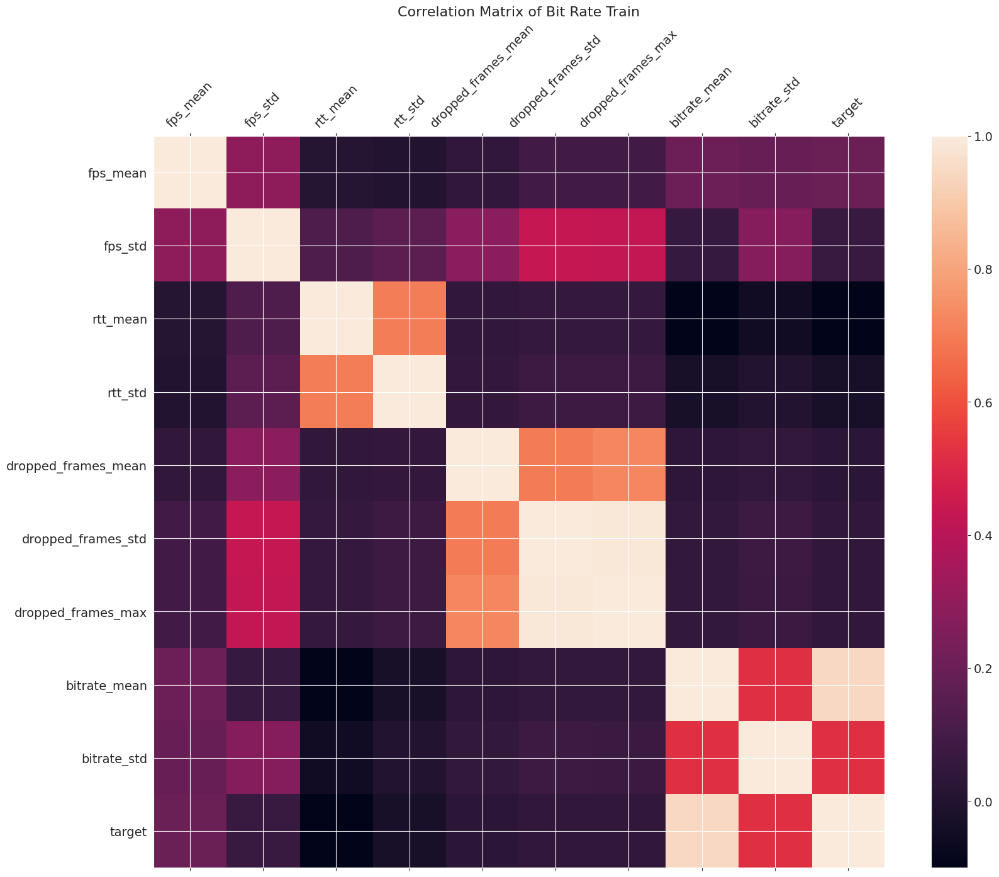

In [5]:
# Plot the correlation Matrix of the Bit Rate train
f = plt.figure(figsize=(19, 15))
plt.matshow(bit_rate.corr(), fignum=f.number)
plt.xticks(range(bit_rate.select_dtypes(['number']).shape[1]), bit_rate.select_dtypes(['number']).columns, fontsize=14,
               rotation=45)
plt.yticks(range(bit_rate.select_dtypes(['number']).shape[1]), bit_rate.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix of Bit Rate Train', fontsize=16)
plt.show()

In [6]:
bit_rate.describe()

,fps_mean,fps_std,rtt_mean,rtt_std,dropped_frames_mean,dropped_frames_std,dropped_frames_max,bitrate_mean,bitrate_std,target
count,379021.000000,379021.000000,379021.000000,379021.000000,379021.000000,379021.000000,379021.000000,379021.000000,379021.000000,379021.000000
mean,35.231127,1.725705,49.623858,12.763672,0.180451,0.469548,1.450719,7516.585502,1603.487501,7525.396231
std,10.975010,2.505942,94.781098,112.684460,1.732890,3.157866,9.670928,6073.992189,1721.021623,6070.817736
min,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.800000,0.316228,14.300000,0.699206,0.000000,0.000000,0.000000,2773.300000,383.683550,2785.000000
50%,30.000000,0.942809,32.200000,1.433721,0.000000,0.000000,0.000000,6287.200000,1112.710010,6296.000000
75%,43.600000,2.233582,55.900000,4.948625,0.000000,0.000000,0.000000,10187.200000,2241.848801,10192.000000
max,125.800000,307.167273,12898.400000,40721.933293,540.000000,202.385770,640.000000,64913.500000,26908.532303,64913.000000


In [7]:
bit_rate_test.describe()

,fps_mean,fps_std,rtt_mean,rtt_std,dropped_frames_mean,dropped_frames_std,dropped_frames_max,bitrate_mean,bitrate_std,target
count,228145.000000,228145.000000,228145.000000,228145.000000,228145.000000,228145.000000,228145.000000,228145.000000,228145.000000,228145.000000
mean,35.134303,1.650973,47.499453,12.941931,0.175502,0.478695,1.475101,7152.536504,1571.218450,7162.583111
std,10.730518,2.352761,86.393924,89.046561,1.369772,3.113315,9.552261,5971.975427,1656.867196,5971.669010
min,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,0.000000,14.400000,0.699206,0.000000,0.000000,0.000000,2572.600000,389.592109,2589.200000
50%,30.000000,0.918937,29.400000,1.595131,0.000000,0.000000,0.000000,6153.400000,1099.427876,6163.800000
75%,43.000000,2.149935,57.600000,5.944185,0.000000,0.000000,0.000000,9928.400000,2211.368505,9932.100000
max,84.600000,150.766044,6584.600000,4855.390045,109.000000,291.878228,923.000000,63320.900000,31201.672303,63320.900000


#### 5. Detecting and Removing the Outliers


In [8]:
def remove_outliers(x, coln):
    """Detects and removes the outliers from the dataframe
    :param x: Dataframe
    :param coln: Feature/Column name from the dataframe"""
    q1 = x[coln].quantile(0.25)
    q3 = x[coln].quantile(0.75)
    iqr = q3-q1     # Inter quartile range
    thresh_low = q1-1.5*iqr
    thresh_high = q3+1.5*iqr
    df_out = x.loc[(x[coln] > thresh_low) & (x[coln] < thresh_high)]
    return df_out

In [9]:
# Remove Outliers from Train set
features = list()
for col in bit_rate.drop(['target'], axis=1).columns:
    features.append(col)
print("All the features in bitrate dataframe : ", features)

print("bit rate shape before removing outliers: ", bit_rate.shape)
bit_rate = remove_outliers(bit_rate, features[1])
bit_rate = remove_outliers(bit_rate, features[2])
bit_rate = remove_outliers(bit_rate, features[3])
print("bit rate shape after removing outliers: ", bit_rate.shape)


All the features in bitrate dataframe :  ['fps_mean', 'fps_std', 'rtt_mean', 'rtt_std', 'dropped_frames_mean', 'dropped_frames_std', 'dropped_frames_max', 'bitrate_mean', 'bitrate_std']
bit rate shape before removing outliers:  (379021, 10)
bit rate shape after removing outliers:  (279833, 10)


In [10]:
# Remove Outliers from Test set
features = list()
for col in bit_rate_test.drop(['target'], axis=1).columns:
    features.append(col)
print("All the features in bitrate test dataframe : ", features)

print("bit rate test shape before removing outliers: ", bit_rate_test.shape)
bit_rate_test = remove_outliers(bit_rate_test, features[1])
bit_rate_test = remove_outliers(bit_rate_test, features[2])
bit_rate_test = remove_outliers(bit_rate_test, features[3])
print("bit rate test shape after removing outliers: ", bit_rate_test.shape)


All the features in bitrate test dataframe :  ['fps_mean', 'fps_std', 'rtt_mean', 'rtt_std', 'dropped_frames_mean', 'dropped_frames_std', 'dropped_frames_max', 'bitrate_mean', 'bitrate_std']
bit rate test shape before removing outliers:  (228145, 10)
bit rate test shape after removing outliers:  (174911, 10)


#### 6. Splitting the targets from the train and test dataframe


In [11]:
# Splitting the 'target' column from the x_train, x_test
# and storing it in y_train, y_test respectively
# We Get the x_train, y_train and x_test, y_test data
x_train = bit_rate.drop(['target'], axis=1)
y_train = bit_rate.loc[:, 'target']
x_test = bit_rate_test.drop(columns=['target'])  # We can also use the columns arg to avoid writing axis = 1
y_test = bit_rate_test.loc[:, 'target']

In [12]:
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(279833, 9) (279833,) (174911, 9) (174911,)


#### 7. Data Preprocessing (Encoding, Imputing, Feature Selection, Scaling...etc)


In [13]:
def encode_one_hot(x):
    """Encodes the Dataframe with the OneHotEncoder
    :param x: X Dataframe which needs to be Encoded, Fitted and Transformed"""
    category_features = x.select_dtypes(include=['object']).columns.tolist()
    print("\nCategorical Features : ", category_features)
    encoder = OneHotEncoder(cols=category_features)
    encoder.fit(x)
    x = encoder.transform(x)
    #print("\nEncoded bit rate x_train : \n", x)
    return x

def impute_simple(x, strategy='mean'):
    """Imputes the Dataframe with the SimpleImputer
    :param x: X Dataframe which needs to be Imputed, Fitted and Transformed
    :param strategy: The strategy by which the dataframe needs to be imputed"""

    imputer = SimpleImputer(strategy='mean')
    imputer.fit(x)
    x = pd.DataFrame(imputer.transform(x), columns=x.columns)
    #print("\nImputed Bit Rate : \n", x)
    return x

def scale_std(x):
    """Scales the Dataframe with the RobustScaler
    :param x: X Dataframe which needs to be Scaled, Fitted and Transformed"""

    scaler = RobustScaler()
    scaler.fit(x)
    x = pd.DataFrame(scaler.transform(x), columns=x.columns)
    #print("\nScaled Bit Rate : \n", x)
    return x

def data_preprocessing(x):
    """Data preprocessing - Encoding, Imputing, Feature Selection, Scaling of the Dataframe
    :param x: X Dataframe which needs to be Encoded, Imputed,
     Scaled, Fitted and Transformed"""

    # Encoding the data with the One Hot Encoder x_train
    x = encode_one_hot(x)

    # Imputing the data with the mean x_train
    x = impute_simple(x, strategy='mean')

    # Feature Selection
    print("Shape before Feature Selection : ", x.shape)
    x = x.replace(0, np.nan)
    x = x.dropna(axis=1, thresh=0.05*len(x))
    print("Removed 95% zero columns")
    print("shape after Feature Selection : ", x.shape)
    x = x.replace(np.nan, 0)

    # Scaling the data with Robust Scaler x_train
    x = scale_std(x)
    return x

In [14]:
# Data preprocessing - Encoding, Imputing, Feature Selection, Scaling
print("\nData-preprocessing of x_train:", end="")
x_train = data_preprocessing(x_train)
print("\nData-preprocessing of x_test:", end="")
x_test = data_preprocessing(x_test)


Data-preprocessing of x_train:
Categorical Features :  []
Shape before Feature Selection :  (279833, 9)
Removed 95% zero columns
shape after Feature Selection :  (279833, 6)

Data-preprocessing of x_test:
Categorical Features :  []
Shape before Feature Selection :  (174911, 9)
Removed 95% zero columns
shape after Feature Selection :  (174911, 6)


In [15]:
x_train.head()

,fps_mean,fps_std,rtt_mean,rtt_std,bitrate_mean,bitrate_std
0,-0.411765,-0.102016,2.106796,3.189255,-0.880464,-0.605249
1,0.000000,-0.390191,1.812298,-0.606899,-0.864454,-0.609610
2,0.000000,-0.390191,1.812298,-0.606899,-0.864454,-0.609610
3,0.000000,-0.390191,1.812298,-0.606899,-0.864454,-0.609610
4,0.000000,-0.390191,1.812298,-0.606899,-0.864454,-0.609610


In [16]:
x_test.head()

,fps_mean,fps_std,rtt_mean,rtt_std,bitrate_mean,bitrate_std
0,-0.008403,-0.209448,0.993711,-0.099786,-0.825568,-0.590565
1,0.000000,-0.394085,0.993711,-0.099786,-0.820650,-0.586424
2,0.000000,-0.394085,1.025157,0.985617,-0.827231,-0.597576
3,-0.008403,-0.209448,1.100629,1.584118,-0.810619,-0.473384
4,0.000000,-0.394085,0.984277,0.042441,-0.819924,-0.588027


Features Selected from the data preprocessing are:


In [17]:
# Selected Features after data preprocessing stage
selected_features = list()
for col in x_train.columns:
    selected_features.append(col)
print("\nSelected Features : ", selected_features)


Selected Features :  ['fps_mean', 'fps_std', 'rtt_mean', 'rtt_std', 'bitrate_mean', 'bitrate_std']


Pair Plot of x_train

In [18]:
def pair_plot(x, suptitle_label='Pair Plot of X data'):
    """Plots a Pair Plot from a Dataframe
    :param x: X Dataframe which needs to be pair-plotted
    :param suptitle_label: It's a label for the plot"""

    plt.figure()
    sns.pairplot(pd.DataFrame(x))
    plt.suptitle(suptitle_label)
    plt.show()
    return None

<Figure size 640x480 with 0 Axes>

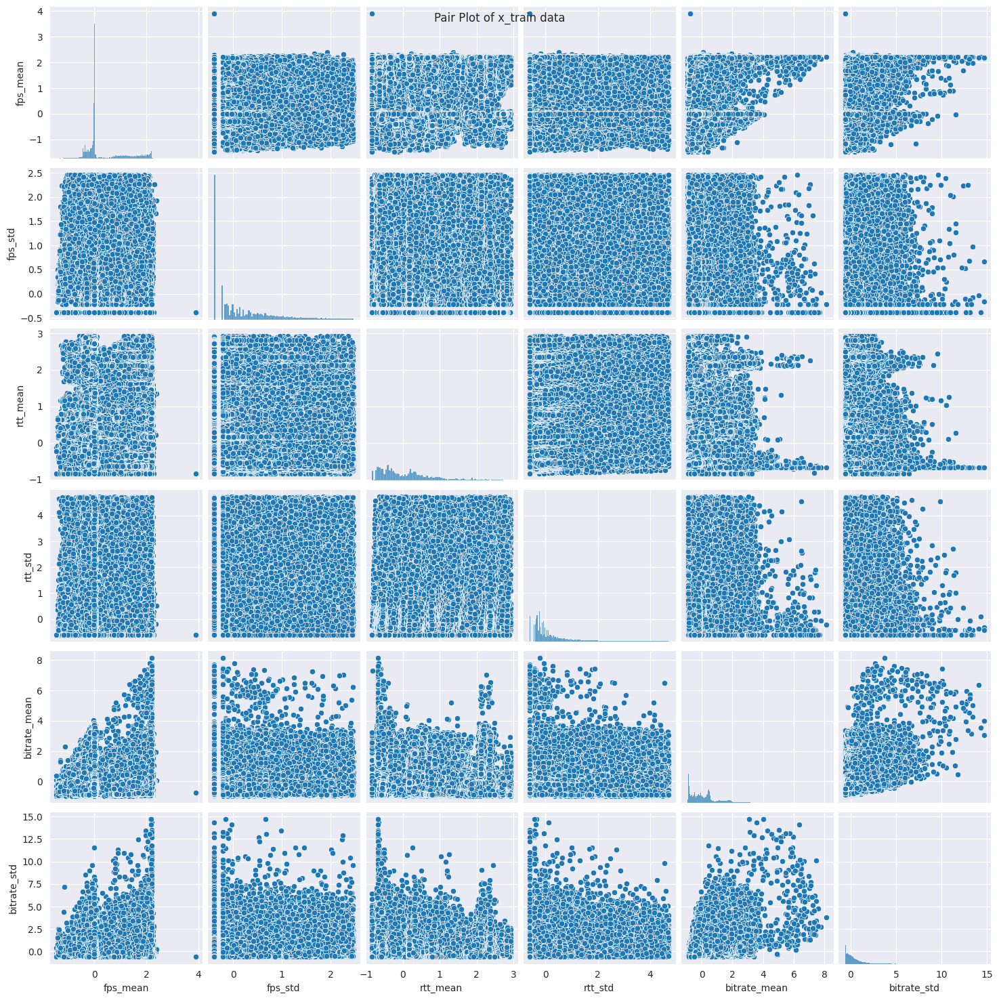

In [19]:
# Pair Plot of x_train after preprocessing of the data
# This takes latest 4 minutes to execute
pair_plot(x_train, suptitle_label="Pair Plot of x_train data")

#### 8. Creating Validation set from the Training set


In [20]:
# Split the x_train to two parts x_val and x_train
x_train, x_val = train_test_split(x_train, test_size=0.2, random_state=0)
y_train, y_val = train_test_split(y_train, test_size=0.2, random_state=0)
print(f"\nShape of x_train : {x_train.shape}\nShape of x_val : {x_val.shape}")
print(f"Shape of y_train : {y_train.shape}\nShape of y_val : {y_val.shape}")


Shape of x_train : (223866, 6)
Shape of x_val : (55967, 6)
Shape of y_train : (223866,)
Shape of y_val : (55967,)


#### 9. PCA Visualization of reduced x_train with y_train



Shape of x_train before PCA (223866, 6)


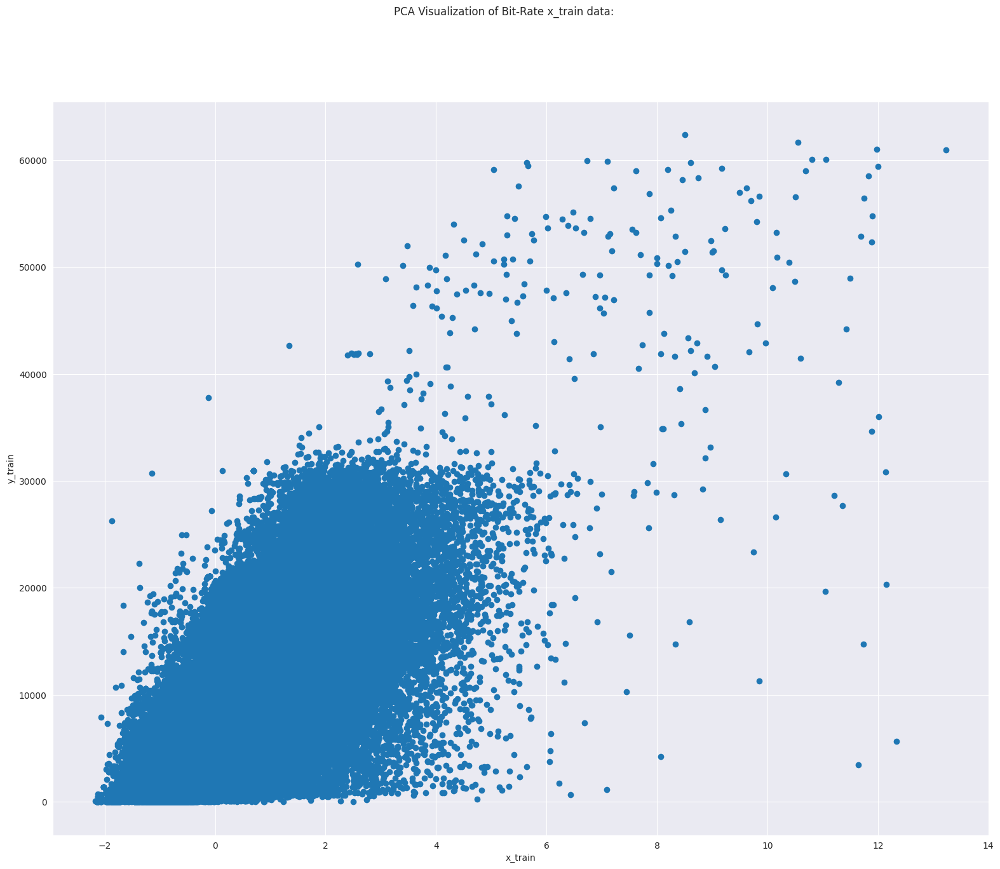


Shape of x_train after PCA (223866, 1)


In [21]:
# PCA Visualization of the Complete Dataframe x_train in 2dimensional graphs
print("\nShape of x_train before PCA", x_train.shape)
dimes_reducer = PCA(n_components=1)
x_train_reduced = dimes_reducer.fit_transform(x_train)
f = plt.figure(figsize=(19, 15))
plt.scatter(x_train_reduced[:, 0], y_train, marker='o')    # x_train_reduced[:, 1]
plt.suptitle("PCA Visualization of Bit-Rate x_train data: ")
plt.xlabel("x_train")
plt.ylabel("y_train")
plt.show()
print("\nShape of x_train after PCA", x_train_reduced.shape)

### 10. Linear Regression

In [22]:
def print_metrics(y_true, y_predict):
    """Prints the Metrics such as MSE, MAE, RMSE, R2 Score of the
    true and predicted values of a particular model
    :param y_true: True target dataframe
    :param y_predict: Predicted target dataframe"""

    print('Mean Squared Error       :', metrics.mean_squared_error(y_true, y_predict))
    print('Mean Absolute Error      :', metrics.mean_absolute_error(y_true, y_predict))
    print('Root Mean Squared Error  :', metrics.mean_squared_error(y_true, y_predict, squared=False))
    print("R2 Score                 : ", r2_score(y_true=y_true, y_pred=y_predict))
    return None

In [23]:
# Linear Regression Model
linear_model = LinearRegression()
linear_model.fit(x_train, y_train)
print(f"\nLinear intercept : {linear_model.intercept_}")
print(f"Linear Coefficient : {linear_model.coef_}")

# Predict the x_test and x_val with the Linear Model
y_pred_test = linear_model.predict(x_test)
y_pred_val = linear_model.predict(x_val)

# Performance of the Linear Regression Model for the Bitrate Prediction
# print(pd.DataFrame({'y_test': y_test, 'y_pred': y_pred}))
print("\nMetrics for Linear Model for Test set")
print_metrics(y_true=y_test, y_predict=linear_model.predict(x_test))
print("\nMetrics for Linear Model for Validation set")
print_metrics(y_true=y_val, y_predict=linear_model.predict(x_val))
print("\nLinear Model Score for Training set : ", linear_model.score(x_test, y_test))
print("Linear Model Score for Validation set : ", linear_model.score(x_val, y_val))

# Check shapes for x_test and y_test
print(x_test.shape, y_test.shape)


Linear intercept : 6788.994405133249
Linear Coefficient : [ 1.28115554e+00  3.07291025e+01 -3.03785338e+01 -3.82439914e+01
  6.63723361e+03  2.49101959e+02]

Metrics for Linear Model for Test set
Mean Squared Error       : 3372564.8626155425
Mean Absolute Error      : 1033.8390145988012
Root Mean Squared Error  : 1836.4544270456433
R2 Score                 :  0.9077032169801612

Metrics for Linear Model for Validation set
Mean Squared Error       : 3391784.6849470246
Mean Absolute Error      : 1028.406008762311
Root Mean Squared Error  : 1841.6798540862158
R2 Score                 :  0.9084224666334341

Linear Model Score for Training set :  0.9077032169801612
Linear Model Score for Validation set :  0.9084224666334341
(174911, 6) (174911,)


### 11. Polynomial Regression

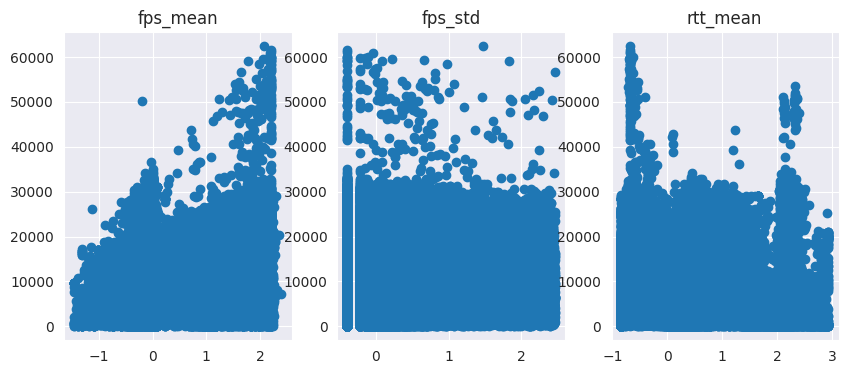

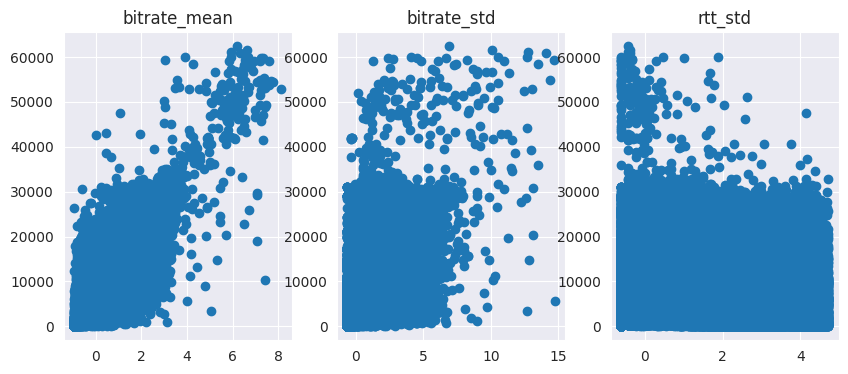

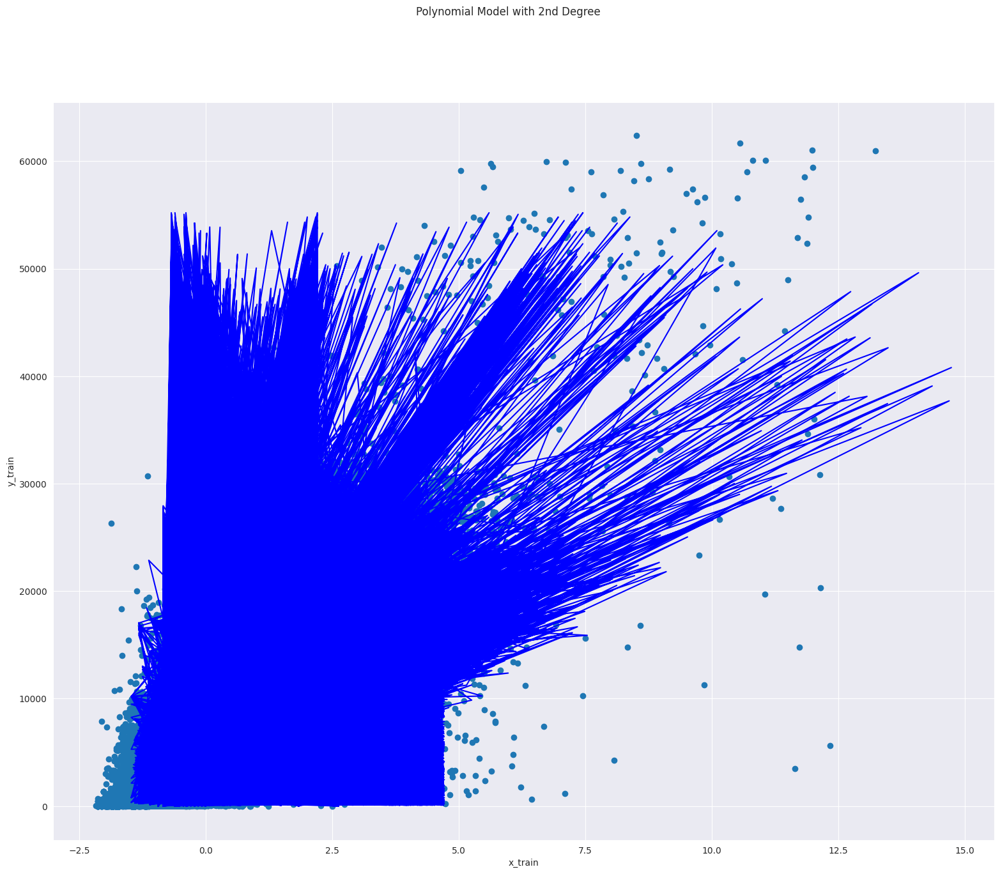

(174911,) (174911,)

Metrics for Polynomial Model for Test set
Mean Squared Error       : 3367726.4888788476
Mean Absolute Error      : 1016.4118840278855
Root Mean Squared Error  : 1835.13664038372
R2 Score                 :  0.9078356284678971

Metrics for Polynomial Model for Validation set
Mean Squared Error       : 3337880.2116721245
Mean Absolute Error      : 999.7814989707999
Root Mean Squared Error  : 1826.9866479184036
R2 Score                 :  0.9098778770319325


In [24]:
# Polynomial Regression Model
poly = PolynomialFeatures(degree=3, include_bias=False)
poly_features = poly.fit_transform(x_train)
poly_regress_model = LinearRegression()
poly_regress_model.fit(poly_features, y_train)
y_pred_poly = poly_regress_model.predict(poly_features)

# Predict the x_test and x_val with the Polynomial Model
poly_features_test = poly.fit_transform(x_test)
y_pred_poly_test = poly_regress_model.predict(poly_features_test)

poly_features_val = poly.fit_transform(x_val)
y_pred_poly_val = poly_regress_model.predict(poly_features_val)

# Plotting the Polynomial Regression graphs
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4))
axes[0].scatter(x_train['fps_mean'], y_train)
axes[1].scatter(x_train['fps_std'], y_train)
axes[2].scatter(x_train['rtt_mean'], y_train)
axes[0].set_title('fps_mean')
axes[1].set_title('fps_std')
axes[2].set_title('rtt_mean')
plt.show()

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4))
axes[0].scatter(x_train['bitrate_mean'], y_train)
axes[1].scatter(x_train['bitrate_std'], y_train)
axes[2].scatter(x_train['rtt_std'], y_train)
axes[0].set_title('bitrate_mean')
axes[1].set_title('bitrate_std')
axes[2].set_title('rtt_std')
plt.show()

# Polynomial Model with 2nd Degree Plot
f = plt.figure(figsize=(19, 15))
plt.scatter(x_train_reduced[:, 0], y_train, marker='o')  # x_train_reduced[:, 1]
plt.plot(x_train, y_pred_poly, c='blue')
plt.suptitle("Polynomial Model with 2nd Degree")
plt.xlabel("x_train")
plt.ylabel("y_train")
plt.show()

# Performance of the Polynomial Regression Model for the Bitrate Prediction
print(y_test.shape, y_pred_poly_test.shape)
print("\nMetrics for Polynomial Model for Test set")
print_metrics(y_true=y_test, y_predict=y_pred_poly_test)
print("\nMetrics for Polynomial Model for Validation set")
print_metrics(y_true=y_val, y_predict=y_pred_poly_val)

### 12. Lasso and Ridge Regression

In [25]:
# Lasso and Ridge
lasso = Lasso()
lasso.fit(x_train, y_train)
ridge = Ridge()
ridge.fit(x_train, y_train)
print('\nLasso coef', lasso.coef_)  # it produces sparse models
print('\nRidge coef', ridge.coef_)


Lasso coef [ 2.19529823e-01  2.91260033e+01 -2.89359808e+01 -3.76032303e+01
  6.63657687e+03  2.48784215e+02]

Ridge coef [ 1.29095309e+00  3.07229529e+01 -3.03834102e+01 -3.82452007e+01
  6.63717679e+03  2.49127541e+02]


### a) Lasso Regression

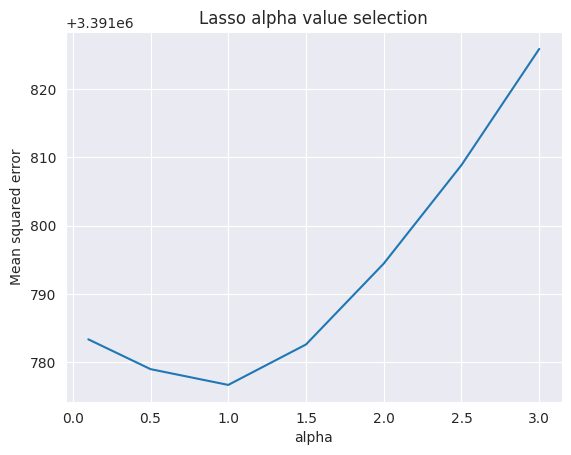

Best value of alpha for Lasso Model is :  1.0

Metrics for Lasso Model for Test set
Mean Squared Error       : 3372661.8122048667
Mean Absolute Error      : 1034.2008561983841
Root Mean Squared Error  : 1836.480822716335
R2 Score                 :  0.9077005637664873

Metrics for Lasso Model for Validation set
Mean Squared Error       : 3391776.7075562067
Mean Absolute Error      : 1028.6581592326258
Root Mean Squared Error  : 1841.6776882929887
R2 Score                 :  0.90842268202145


In [26]:
# Lasso Model
# Calculating the best Alpha for Lasso Model
alphas = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
mse_s = []
for alpha in alphas:
    lasso_model = Lasso(alpha=alpha).fit(x_train, y_train)  # change lasso to ridge and you will get some other value
    mse = mean_squared_error(lasso_model.predict(x_val), y_val)
    mse_s.append(mse)
plt.plot(alphas, mse_s)
plt.title("Lasso alpha value selection")
plt.xlabel("alpha")
plt.ylabel("Mean squared error")
plt.show()

best_alpha = alphas[np.argmin(mse_s)]
print("Best value of alpha for Lasso Model is : ", best_alpha)

lasso_model = Lasso(alpha=best_alpha)
lasso_model.fit(x_train, y_train)
y_lasso_pred_test = lasso_model.predict(x_test)
y_lasso_pred_val = lasso_model.predict(x_val)

# Performance of the Ridge Model for the Bitrate Prediction
print("\nMetrics for Lasso Model for Test set")
print_metrics(y_true=y_test, y_predict=y_lasso_pred_test)
print("\nMetrics for Lasso Model for Validation set")
print_metrics(y_true=y_val, y_predict=y_lasso_pred_val)

### b) Ridge Regression


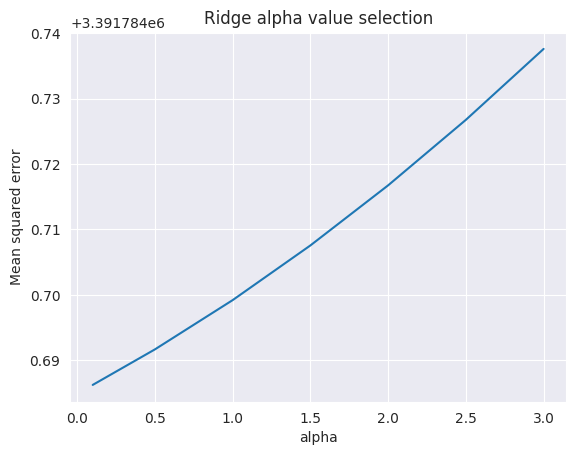

Best value of alpha for Ridge Model is :  0.1

Metrics for Ridge Model for Test set
Mean Squared Error       : 3372565.0657965895
Mean Absolute Error      : 1033.8399718330807
Root Mean Squared Error  : 1836.4544823644799
R2 Score                 :  0.9077032114197175

Metrics for Ridge Model for Validation set
Mean Squared Error       : 3391784.6862227134
Mean Absolute Error      : 1028.4070415981525
Root Mean Squared Error  : 1841.679854432554
R2 Score                 :  0.9084224665989907
Ridge Model Score for Validation set :  0.9084224662487663


In [27]:
# Ridge Model
# Calculating the best Alpha for Ridge Model
alphas = [0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
mse_s = []
for alpha in alphas:
    ridge_model = Ridge(alpha=alpha).fit(x_train, y_train)  # change lasso to ridge and you will get some other value
    mse = mean_squared_error(ridge_model.predict(x_val), y_val)
    mse_s.append(mse)
plt.plot(alphas, mse_s)
plt.title("Ridge alpha value selection")
plt.xlabel("alpha")
plt.ylabel("Mean squared error")
plt.show()

best_alpha = alphas[np.argmin(mse_s)]
print("Best value of alpha for Ridge Model is : ", best_alpha)

ridge_model = Ridge(alpha=best_alpha)
ridge_model.fit(x_train, y_train)
y_ridge_pred_test = ridge_model.predict(x_test)
y_ridge_pred_val = ridge_model.predict(x_val)

# Performance of the Ridge Model for the Bitrate Prediction
print("\nMetrics for Ridge Model for Test set")
print_metrics(y_true=y_test, y_predict=y_ridge_pred_test)
print("\nMetrics for Ridge Model for Validation set")
print_metrics(y_true=y_val, y_predict=y_ridge_pred_val)

print("Ridge Model Score for Validation set : ", ridge.score(x_val, y_val))

## End of the Regression task